### Dobór algorytmu klasyfikującego 
##### Nie ma algorytmu który działa optymalnie dla wszyskich przypadków (Tw. o nie istnieniu darmowych obiadów). Zalecane jest zawsze sparwdzenie kliku algortymów i wybranie najlepszego. 

##### Skuteczność algortymu w najwiekszym stopniu zależy od danych uczących. 

Etapy trenowania nadzorowanego:
- Dobór cech i zgromadzenie oznakowanych przykładów uczących (labeling)
- Dobór metryki skuteczności 
- Wybór klasyfikatora i algorytmu optmalizacji 
- Strojenie Algorytmu 

In [14]:
# import datasetu X- długość i szerokość płatka, y- etykiety klas (labelki)
from sklearn import datasets
import numpy as np

In [15]:
iris = datasets.load_iris()
X = iris.data
X

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [16]:
X = iris.data[:,[2,3]] # 2 i 3 kolumna 
X

array([[1.4, 0.2],
       [1.4, 0.2],
       [1.3, 0.2],
       [1.5, 0.2],
       [1.4, 0.2],
       [1.7, 0.4],
       [1.4, 0.3],
       [1.5, 0.2],
       [1.4, 0.2],
       [1.5, 0.1],
       [1.5, 0.2],
       [1.6, 0.2],
       [1.4, 0.1],
       [1.1, 0.1],
       [1.2, 0.2],
       [1.5, 0.4],
       [1.3, 0.4],
       [1.4, 0.3],
       [1.7, 0.3],
       [1.5, 0.3],
       [1.7, 0.2],
       [1.5, 0.4],
       [1. , 0.2],
       [1.7, 0.5],
       [1.9, 0.2],
       [1.6, 0.2],
       [1.6, 0.4],
       [1.5, 0.2],
       [1.4, 0.2],
       [1.6, 0.2],
       [1.6, 0.2],
       [1.5, 0.4],
       [1.5, 0.1],
       [1.4, 0.2],
       [1.5, 0.2],
       [1.2, 0.2],
       [1.3, 0.2],
       [1.4, 0.1],
       [1.3, 0.2],
       [1.5, 0.2],
       [1.3, 0.3],
       [1.3, 0.3],
       [1.3, 0.2],
       [1.6, 0.6],
       [1.9, 0.4],
       [1.4, 0.3],
       [1.6, 0.2],
       [1.4, 0.2],
       [1.5, 0.2],
       [1.4, 0.2],
       [4.7, 1.4],
       [4.5, 1.5],
       [4.9,

In [17]:
y = iris.target
print("Eytkiety klas", np.unique(y))
# iris setosa -1, iris versicolor - 2, iris viginica - 3

Eytkiety klas [0 1 2]


In [18]:
# podział datasetu na zbiór treningowy i testowy, żeby ocenić skueczność uczenia modelu 
from sklearn.model_selection import train_test_split

# zawsze trzeba ustawiać tasowanie danych "random state" aby unikąc wrzucenia klas 0 i 1 tylko do
# zbioru uczacego 
# stratify - ustawia wszyskie zbiory w równej proporcji 
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=1, stratify=y)

In [19]:
len(y_test)

45

In [20]:
# bitcount zlicza wystąpienia każdej wartości w danej tablicy 
print("lableki w zb. y", np.bincount(y))
print("lableki w zb. y_train", np.bincount(y_train))
print("lableki w zb. y_test", np.bincount(y_test))

lableki w zb. y [50 50 50]
lableki w zb. y_train [35 35 35]
lableki w zb. y_test [15 15 15]


In [21]:
# skalowanie cech za pomoaca funkcji w sklearnie 
from sklearn.preprocessing import StandardScaler

sc = StandardScaler() #przdzielanie fukcji do zmiennej
sc.fit(X,y) # funkcja walicza odchylenie std. i średnią
#  TRZEBA WYKORZYSTAĆ TA SAMA STDANDARYZACJE NA ZD. TRAIN I TEST ZEBY BYŁY PORÓWNYWALNE 
X_train_std = sc.transform(X_train) #standaryzacja
X_test_std = sc.transform(X_test) #standaryzacja

In [22]:
# uczenie medtodą OvR(one vs Rest) dzięki czemu można podać wszstkie 3 klasy do perceptronu 

from sklearn.linear_model import Perceptron

perceptron = Perceptron(eta0=0.01, random_state=1)
perceptron.fit(X_train_std, y_train )


Perceptron(eta0=0.01, random_state=1)

In [23]:
# przewidywania perceptronu (metoda predict)

y_pred = perceptron.predict(X_test_std)
print("nieprawidłowo sklasyfikowane przykłady: %d" % (y_test != y_pred).sum())

nieprawidłowo sklasyfikowane przykłady: 2


In [24]:
# źle sklasyfikowy 2 z 45 przykłądów (2/45 = 0,044 czyli 4,4%, dokłaność 95,6%)

In [25]:
# sprawdzanie dokładnaości za pomocą metryki dokładnaości 
from sklearn.metrics import accuracy_score
prc = accuracy_score(y_test, y_pred)
print("dokładnaośc: ", prc * 100 ,"%")

dokładnaośc:  95.55555555555556 %


In [26]:
# metoda score oblicza dokładnośc poprzez połącznie wywołania funkcji predict z acc_score
print("dokładnosc:", perceptron.score(X_test_std, y_test))

dokładnosc: 0.9555555555555556


In [58]:
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

# To check recent matplotlib compatibility
import matplotlib
from distutils.version import LooseVersion


def plot_decision_regions(X, y, classifier, test_idx=None, resolution=0.02):

    # setup marker generator and color map
    markers = ('o', 's', '^', 'v', '<')
    colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))
    lab = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    lab = lab.reshape(xx1.shape)
    plt.figure(figsize=(9,6))
    plt.contourf(xx1, xx2, lab, alpha=0.3, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())
    

    # plot class examples
    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], 
                    y=X[y == cl, 1],
                    alpha=0.8, 
                    c=colors[idx],
                    marker=markers[idx], 
                    label=f'Class {cl}', 
                    edgecolor='black')

    # highlight test examples
    if test_idx:
        # plot all examples
        X_test, y_test = X[test_idx, :], y[test_idx]

        plt.scatter(X_test[:, 0],
                    X_test[:, 1],
                    c='none',
                    edgecolor='black',
                    alpha=1.0,
                    linewidth=1,
                    marker='o',
                    s=100, 
                    label='Test set')

In [28]:
len(y_test)

45

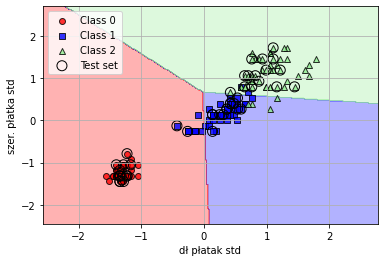

In [29]:
# zdefiniowanie indeksów, które chcemy zazanczyć na przykładach

#vstack- ustawia wszyskie wartości w jednej kolumnie 

#hastack- ustwia wsztskie wartości w jedym wierszu 

X_combined_std = np.vstack((X_train_std, X_test_std))
y_combined = np.hstack((y_train, y_test))

plot_decision_regions(X=X_combined_std, y=y_combined,
                      classifier=perceptron, test_idx=range(105, 150))
plt.xlabel("dł płatak std")
plt.ylabel("szer. płatka std")
plt.legend(loc="upper left")
plt.grid()
plt.show()
# z racji że perceptron jest tylko linowo rozdzielny wyodrebnił tylko jedną krupę klas 

### Regresja logistyczna 
#### Model binarny przewidujacy szanse zdarzenia sie sytuacji na podstawie funkcji logitowej czyli logarytmam ilorazu szans. Funkcje aktywacji pełni tu funkcja sigmoidalna
p / (1-p) gdzie p - prawdopodobieństwo pozytwnego zdarzenia y=1
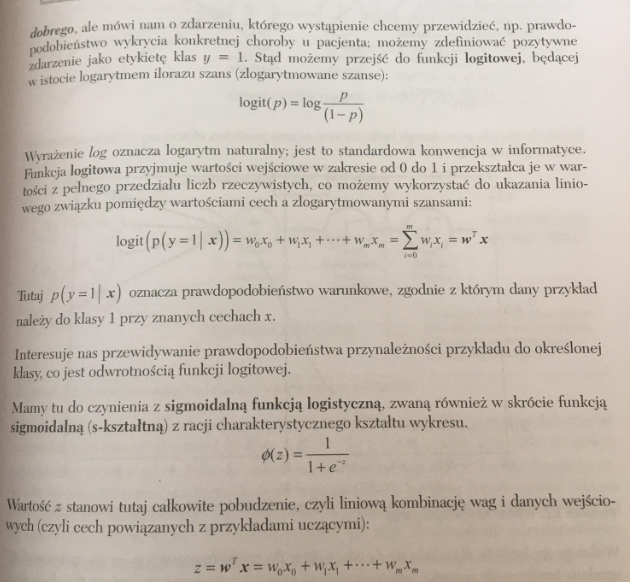

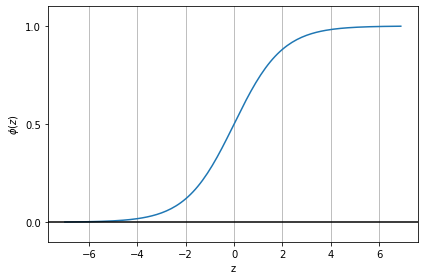

In [31]:
# funkcja sigmoidalna
import matplotlib.pyplot as plt
import numpy as np

def sigmoid(z):
    return 1.0/ (1.0 + np.exp(-z))
z = np.arange(-7,7,0.1)
phi_z = sigmoid(z)
plt.plot(z,phi_z)
plt.axhline(0.0, color="k")
plt.ylim(-0.1, 1.1)
plt.xlabel("z")
plt.ylabel("$\phi (z)$")

plt.yticks([0.0, 0.5, 1.0])
ax = plt.gca()
ax.yaxis.grid(True)
plt.tight_layout()
plt.grid()
plt.show()

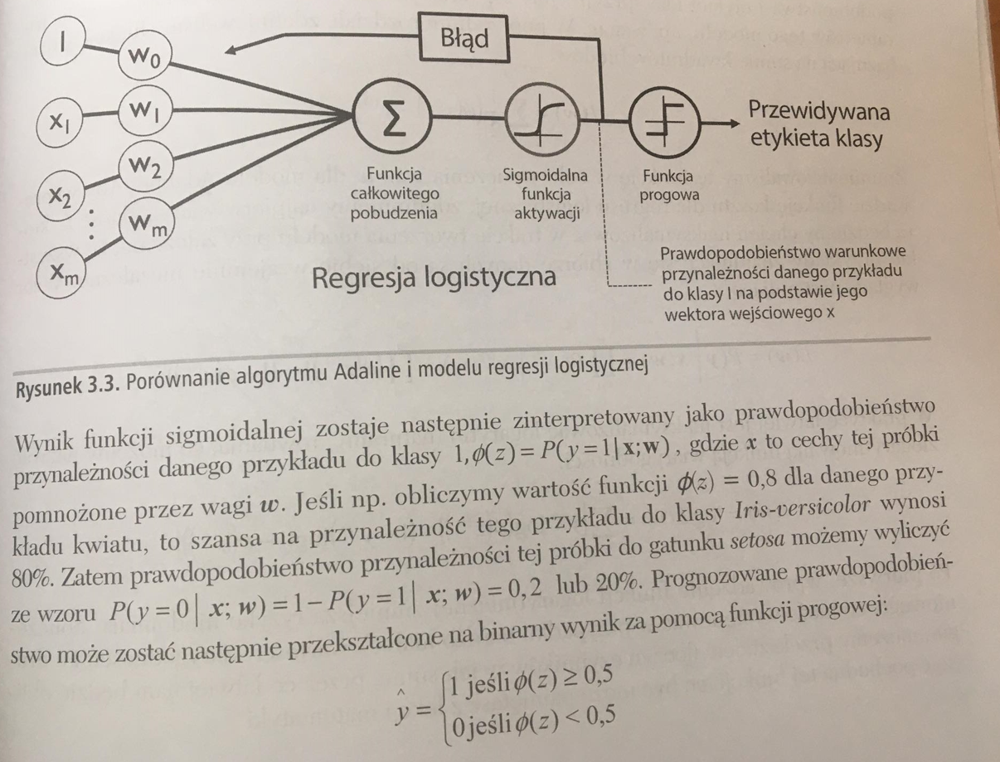

### Wyznaczanie wag logistycznej funkcji kosztu
##### Przy wyznaczaniu kosztu funkcji sigmoidalnej uwzględnia się procentowe prawdopodobieństwo prznynależności do jakiejś klasy. 
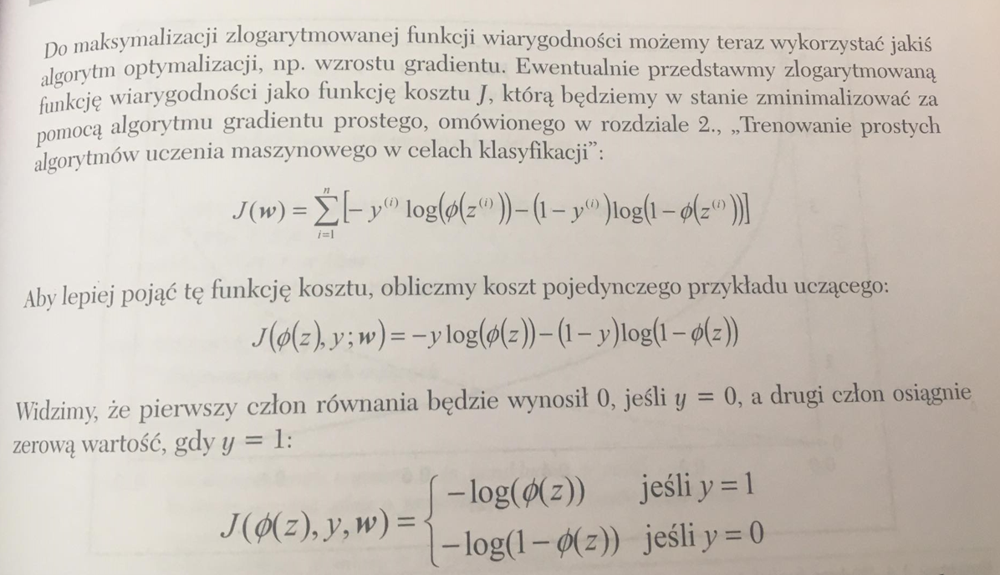

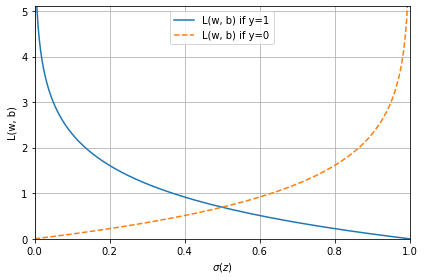

In [32]:
import numpy as np
import matplotlib.pyplot as plt
def loss_1(z):
    return - np.log(sigmoid(z))


def loss_0(z):
    return - np.log(1 - sigmoid(z))

z = np.arange(-10, 10, 0.1)
sigma_z = sigmoid(z)

c1 = [loss_1(x) for x in z]
plt.plot(sigma_z, c1, label='L(w, b) if y=1')

c0 = [loss_0(x) for x in z]
plt.plot(sigma_z, c0, linestyle='--', label='L(w, b) if y=0')

plt.ylim(0.0, 5.1)
plt.xlim([0, 1])
plt.xlabel('$\sigma(z)$')
plt.ylabel('L(w, b)')
plt.legend(loc='best')
plt.tight_layout()
plt.grid()
#plt.savefig('figures/03_04.png', dpi=300)
plt.show()

### KOSZT DĄZY DO ZREA JEŚLI POPRAWNIE PRZEWIDUJEMY KLASE 

Przekształcanie modelu Adaline do funkcji Regresji logistycznej.
Trzeba zamienić:
- f. kosztu 
- f. atywacji 
- etykiety muszą zwaracć 0 i 1 

In [33]:
class LogisticRegressionGD:
    """Gradient descent-based logistic regression classifier.

    Parameters
    ------------
    eta : float
      Learning rate (between 0.0 and 1.0)
    n_iter : int
      Passes over the training dataset.
    random_state : int
      Random number generator seed for random weight
      initialization.


    Attributes
    -----------
    w_ : 1d-array
      Weights after training.
    b_ : Scalar
      Bias unit after fitting.
    losses_ : list
       Log loss function values in each epoch.

    """
    def __init__(self, eta=0.01, n_iter=50, random_state=1):
        self.eta = eta
        self.n_iter = n_iter
        self.random_state = random_state

    def fit(self, X, y):
        """ Fit training data.

        Parameters
        ----------
        X : {array-like}, shape = [n_examples, n_features]
          Training vectors, where n_examples is the number of examples and
          n_features is the number of features.
        y : array-like, shape = [n_examples]
          Target values.

        Returns
        -------
        self : Instance of LogisticRegressionGD

        """
        rgen = np.random.RandomState(self.random_state)
        self.w_ = rgen.normal(loc=0.0, scale=0.01, size=X.shape[1])
        self.b_ = np.float_(0.)
        self.losses_ = []

        for i in range(self.n_iter):
            net_input = self.net_input(X)
            output = self.activation(net_input)
            errors = (y - output)
            self.w_ += self.eta * X.T.dot(errors) / X.shape[0]
            self.b_ += self.eta * errors.mean()
            loss = (-y.dot(np.log(output)) - (1 - y).dot(np.log(1 - output))) / X.shape[0]
            self.losses_.append(loss)
        return self

    def net_input(self, X):
        """Calculate net input"""
        return np.dot(X, self.w_) + self.b_

    def activation(self, z):
        """Compute logistic sigmoid activation"""
        return 1. / (1. + np.exp(-np.clip(z, -250, 250)))

    def predict(self, X):
        """Return class label after unit step"""
        return np.where(self.activation(self.net_input(X)) >= 0.5, 1, 0)

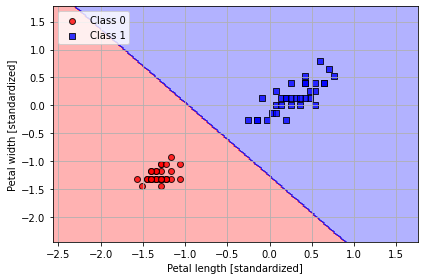

In [34]:
X_train_01_subset = X_train_std[(y_train == 0) | (y_train == 1)]
y_train_01_subset = y_train[(y_train == 0) | (y_train == 1)]

lrgd = LogisticRegressionGD(eta=0.3, n_iter=1000, random_state=1)
lrgd.fit(X_train_01_subset,
         y_train_01_subset)

plot_decision_regions(X=X_train_01_subset, 
                      y=y_train_01_subset,
                      classifier=lrgd)

plt.xlabel('Petal length [standardized]')
plt.ylabel('Petal width [standardized]')
plt.legend(loc='upper left')

plt.tight_layout()
plt.grid()
#plt.savefig('figures/03_05.png', dpi=300)
plt.show()

### Regresja losgistyczna w funkcji sklearn
#### Reg. logistyczna może przewidywać wystąpienie jakiegoś przykładu w wielu klasach taka metoda to OvR One vs Rest 

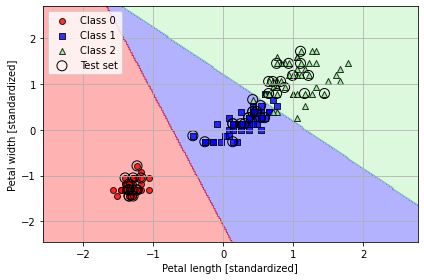

In [35]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(C=100.0, solver='lbfgs', multi_class='ovr')
lr.fit(X_train_std, y_train)

plot_decision_regions(X_combined_std, y_combined,
                      classifier=lr, test_idx=range(105, 150))
plt.xlabel('Petal length [standardized]')
plt.ylabel('Petal width [standardized]')
plt.legend(loc='upper left')
plt.tight_layout()
plt.grid()
#plt.savefig('figures/03_06.png', dpi=300)
plt.show()

In [36]:
# prawdopodobiństwo przynależności przykładu do okreslonej kalsy (predict_proba)
# - pierwszy wiersz przynależnośc danego kwiatu do 3 róznych gatunków 
pred = lr.predict_proba(X_test_std[:3, :])
pred

array([[3.75921857e-09, 1.44746713e-01, 8.55253283e-01],
       [8.34050709e-01, 1.65949291e-01, 2.79885839e-13],
       [8.48851960e-01, 1.51148040e-01, 2.22264680e-14]])

In [37]:
pred_ = (pred*100).round(2)
pred_

array([[ 0.  , 14.47, 85.53],
       [83.41, 16.59,  0.  ],
       [84.89, 15.11,  0.  ]])

In [38]:
# sumowanie kolumn (wartość 1 czyli 100%)
lr.predict_proba(X_test_std[:3, :]).sum(axis=1)

array([1., 1., 1.])

In [39]:
## najwyższe prawdopodobieństwa 
# pierszy przykład to klasa 2 drugi i trzcie to klasa 0
lr.predict_proba(X_test_std[:3, :]).argmax(axis=1)

array([2, 0, 0], dtype=int64)

In [40]:
# PREDICT DZIAŁA TAK SAMO JAK ARGMAX 
lr.predict(X_test_std[:3, :])

array([2, 0, 0])

##### Jeśli checmy przewidywać etykietę klasy pjedyńczego przykładu musimy zamieć tabilce na 2D

In [41]:
lr.predict(X_test_std[0, :].reshape(1, -1))

array([2])

### Regularyzacja L2
#### Zapobiega overfitingowi (model z wariancją) poprzez ograniczanie dużych wartości wag. Lambda to parametr regularyzacji. Aby regularyzacja działała prawidłowo cechy musza być ustaandaryzowane 
!!!
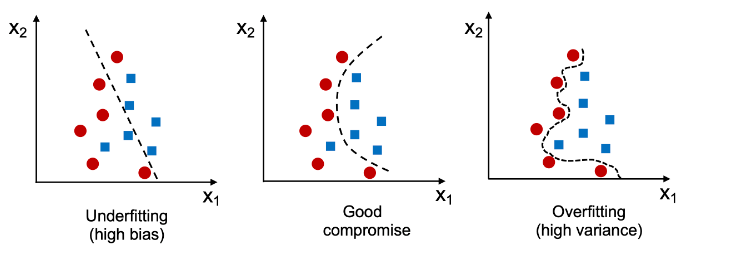
#### Wystarczy dosać odpowiedni człon do funcji kosztu.
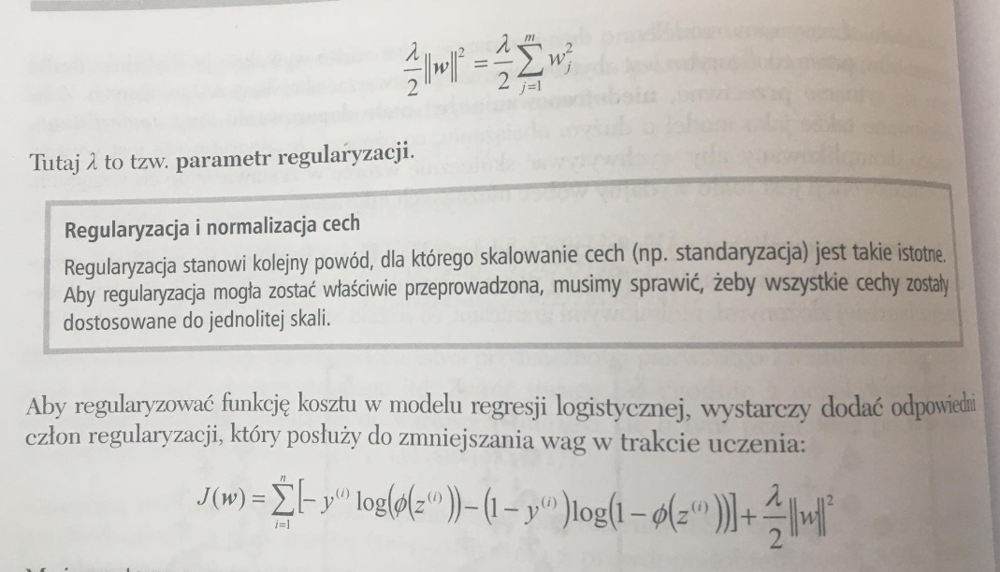

- teraz można kontrolowac uczenie przez rgulacje lambdy, im wyższa wartość tym wagi bardziej ograniczone 
- Parametr C to odwrotność lambdy, jeśli zmiejszamy odwrotność pramateru C to zwiększamy lambdę  

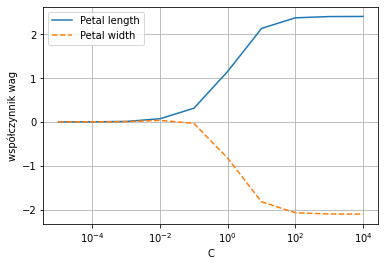

In [42]:
weights, params = [], []
for c in np.arange(-5, 5):
    lr = LogisticRegression(C=10.**c,
                            multi_class='ovr')
    lr.fit(X_train_std, y_train)
    weights.append(lr.coef_[1])
    params.append(10.**c)

weights = np.array(weights)
plt.plot(params, weights[:, 0],
         label='Petal length')
plt.plot(params, weights[:, 1], linestyle='--',
         label='Petal width')
plt.ylabel('współczynnik wag')
plt.xlabel('C')
plt.legend(loc='upper left')
plt.xscale('log')
plt.grid()
#plt.savefig('figures/03_08.png', dpi=300)
plt.show()

## im mniejsza wartośćpratametru C tym mniejsza wartość parametru wag 

### Maszyna SVM i wyznaczanie maksymalnego marginesu 
##### Masznyny wektorów nośnych sa podobne do preceptronu ale nie obliczają sumy odległości kwadratów tyllko zwiekszają margines. Margines to odległość miedzy hiperprzestrzenią rozdielająca a przykładem uczącym (wetkoram nośnym)
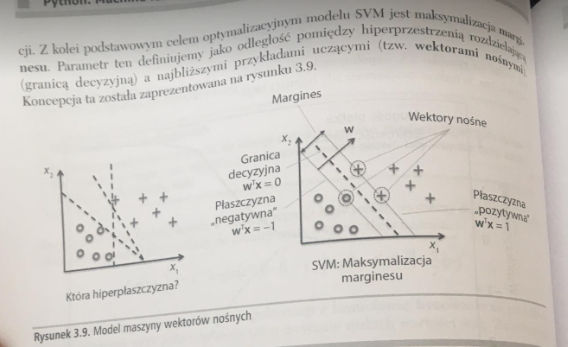
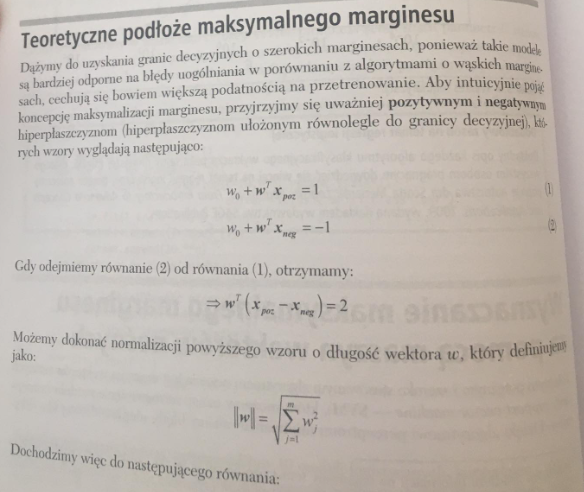
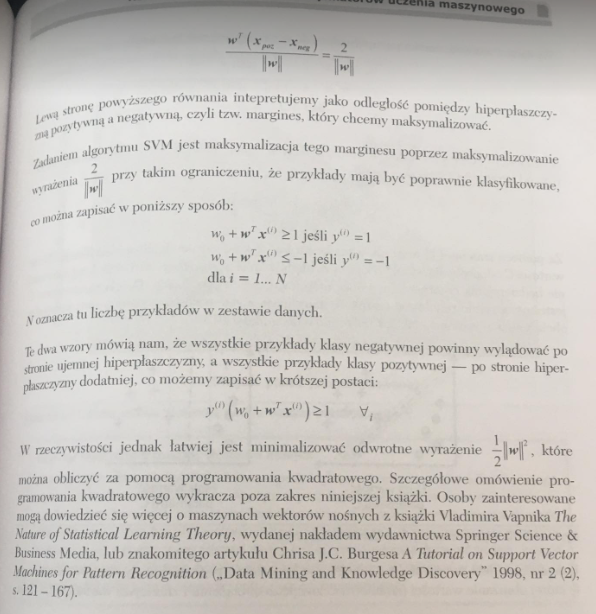

|w| - znormalizacja danych 
na podstawie wzorów można stawiedzić że wszyskie pozytywne przykłady powinny leżeć po stronie hiperpłaszczyny doatniej a negatywne po ujemnej 

### Przypadki rozdzielne nie liniowo "metoda miekkiego marginesu"
##### S (slack variable) "uelastycznia" linowe ograniczenia. Trzeba wstawic zmienna uzupełniająca do wzoru \
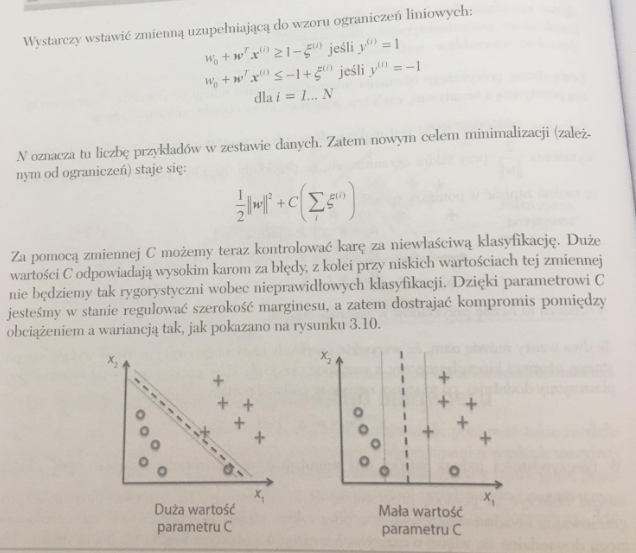

- duża watość parametru C to duża kara za złe klasyfikacje 
 - ODWROTNIE JAK W REG. LOISTYCZNEJ PARAM. C ZMNIEJSZA OVERFITNING 

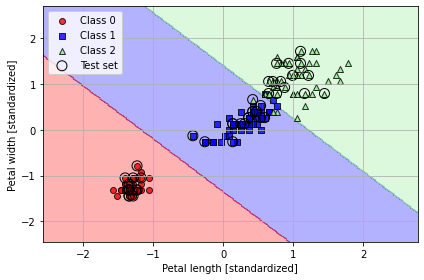

In [43]:
from sklearn.svm import SVC

svm = SVC(kernel='linear', C=1.0, random_state=1)
svm.fit(X_train_std, y_train)

plot_decision_regions(X_combined_std, 
                      y_combined,
                      classifier=svm, 
                      test_idx=range(105, 150))
plt.xlabel('Petal length [standardized]')
plt.ylabel('Petal width [standardized]')
plt.legend(loc='upper left')
plt.tight_layout()
plt.grid()
#plt.savefig('figures/03_11.png', dpi=300)
plt.show()

### Rozwiązywanie nieliowych problemów "kernelizacja"
#### Kernelizacja do rzutowanie nielinowych danych na wiekszą iość wymiarów gdzie dane można rodzielić liniowo np. płaszczyzną 
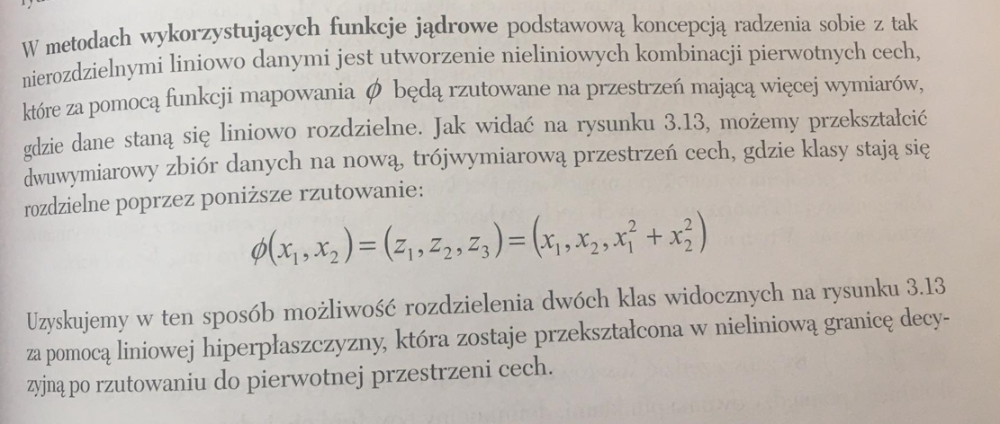
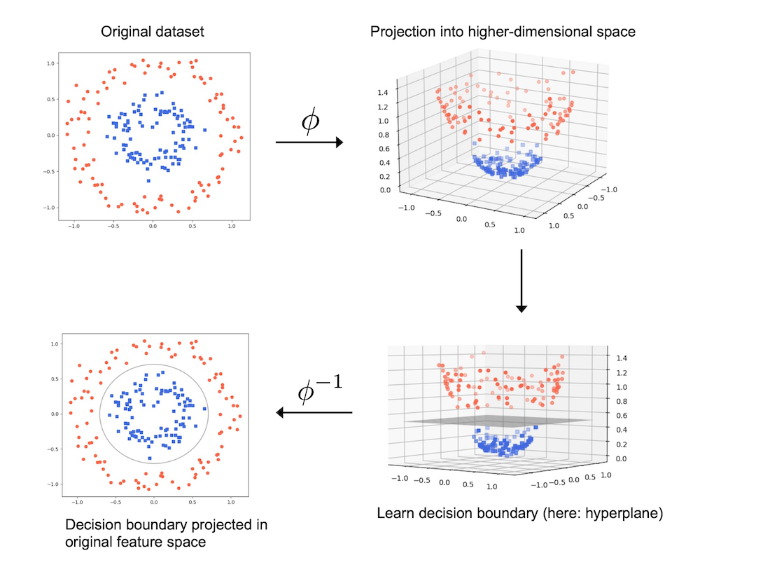

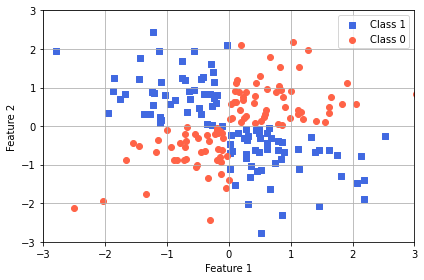

In [44]:
### Tworzenie zestwu wieomianowego 

import matplotlib.pyplot as plt
import numpy as np

np.random.seed(1)
X_xor = np.random.randn(200, 2)
y_xor = np.logical_xor(X_xor[:, 0] > 0,
                       X_xor[:, 1] > 0)
y_xor = np.where(y_xor, 1, 0)

plt.scatter(X_xor[y_xor == 1, 0],
            X_xor[y_xor == 1, 1],
            c='royalblue',
            marker='s',
            label='Class 1')
plt.scatter(X_xor[y_xor == 0, 0],
            X_xor[y_xor == 0, 1],
            c='tomato',
            marker='o',
            label='Class 0')

plt.xlim([-3, 3])
plt.ylim([-3, 3])
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

plt.legend(loc='best')
plt.tight_layout()
plt.grid()
#plt.savefig('figures/03_12.png', dpi=300)
plt.show()

## stosowanie sztuczki z funcji jadrem
powoduje że rzutowanie danych na wikszą ilość wymiarów staje się mniej "obliczożerne".Zamieniamy iloczyn skalrny macierzy na iloczyn dwóch funkcji. Najcześciej stosuje sie jądro gausowskie 
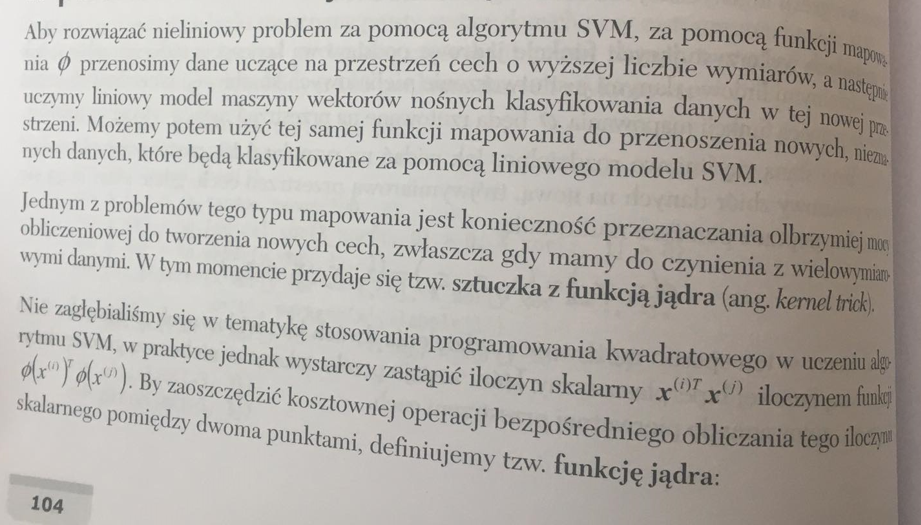
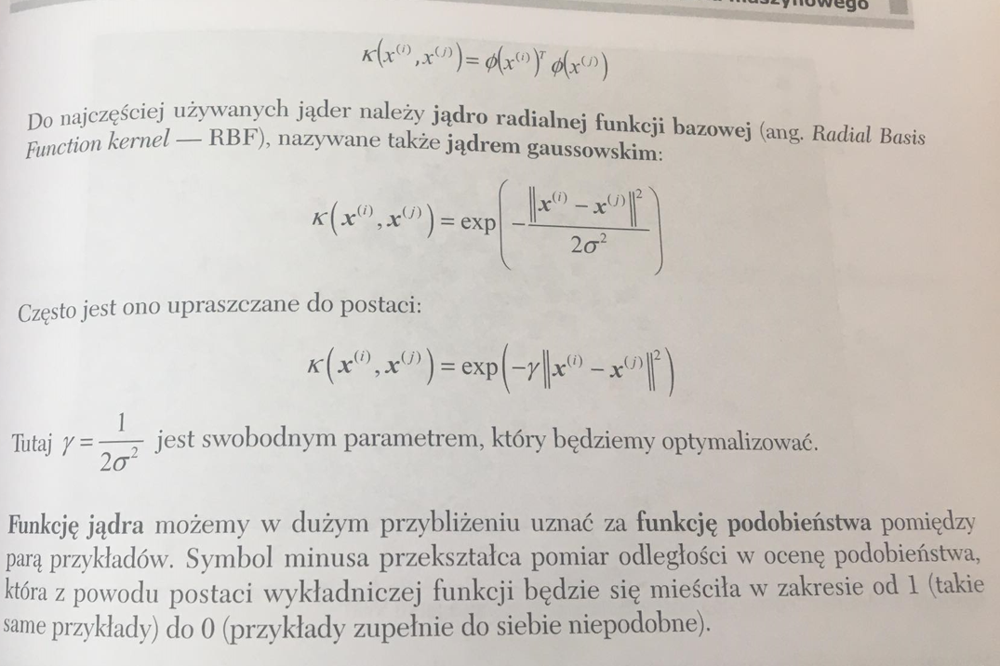

#### Duże naczenie ma parametr gamma, który określa wpływ danych uczących na algorym, im wiekszy parametr tym bardziej związłe granice decyzyjne

zamieniamy kernel z linear na rbf

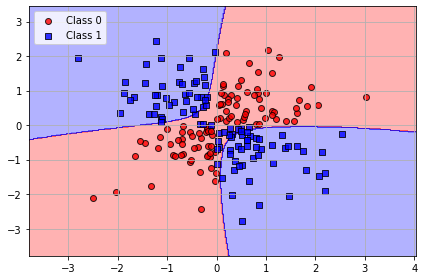

In [45]:
svm = SVC(kernel='rbf', random_state=1, gamma=0.10, C=10.0) 
svm.fit(X_xor, y_xor)
plot_decision_regions(X_xor, y_xor,
                      classifier=svm)

plt.legend(loc='upper left')
plt.tight_layout()
plt.grid()
#plt.savefig('figures/03_14.png', dpi=300)
plt.show()

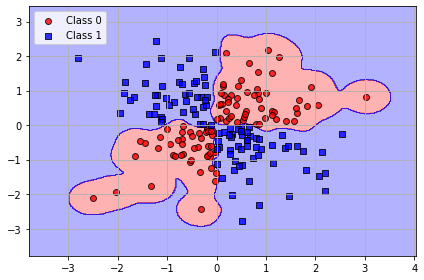

In [46]:
svm = SVC(kernel='rbf', random_state=1, gamma=10.0, C=10.0) 
svm.fit(X_xor, y_xor)
plot_decision_regions(X_xor, y_xor,
                      classifier=svm)

plt.legend(loc='upper left')
plt.tight_layout()
plt.grid()
#plt.savefig('figures/03_14.png', dpi=300)
plt.show()

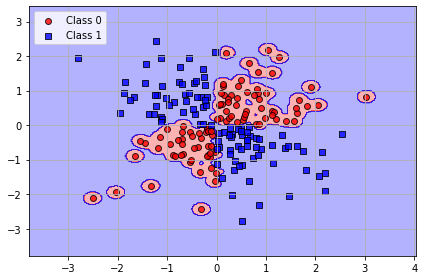

In [47]:
svm = SVC(kernel='rbf', random_state=1, gamma=100.0, C=10.0) 
svm.fit(X_xor, y_xor)
plot_decision_regions(X_xor, y_xor,
                      classifier=svm)

plt.legend(loc='upper left')
plt.tight_layout()
plt.grid()
#plt.savefig('figures/03_14.png', dpi=300)
plt.show()

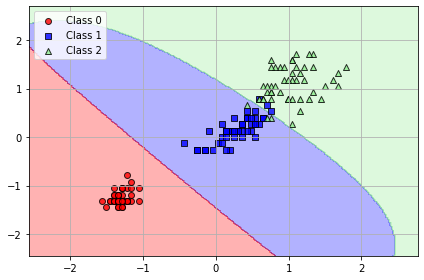

In [48]:
svm_ = SVC(kernel="rbf", gamma=0.2, C=1.0, random_state=1)
svm_.fit(X_train_std, y_train)
plot_decision_regions(X_combined_std, y_combined, classifier=svm_)

plt.legend(loc='upper left')
plt.tight_layout()
plt.grid()
#plt.savefig('figures/03_14.png', dpi=300)
plt.show()

### Drzewa decyzyjne 
##### Powstają  w skutek zadawania pytan i torzenia węzłów wewnętrznych, które poszukują danej etykiety dla klasy. Mogoą szybko zoverfitować 
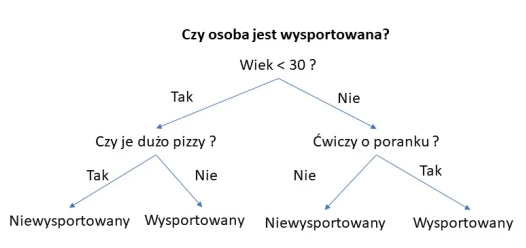

##### f. celu - maksymalizacja inforamcji w każdym rozgałęzieniu, poprzez mierzenie zanieczyszczenia (węzeł nardrzędnych - wezeł podrzędny = zanieczyszczenie (I) )
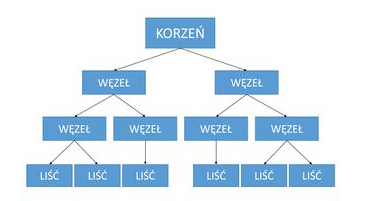
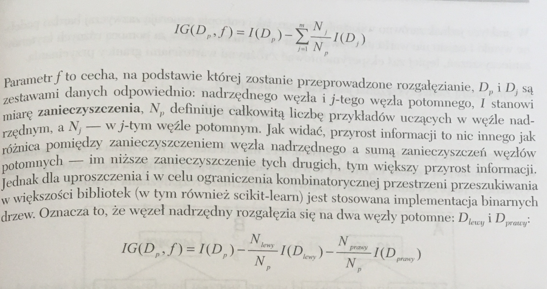


##### Miary zanieczyszczenia: Wkaźnik Giniego, Entropia, Błąd klasyfikacji.
##### Entropia makzymalizacja wzajemnycj informacji w drzewie. Entropia = 0 jesli wsztkie przykłady należą do tej samej klasy. Entropia = 1 przy jednostanjnym rozkładzie klas 
##### Wskaźnik Giniego - minimalizacja prawdopobiństwa nieprawidłowej klasy 
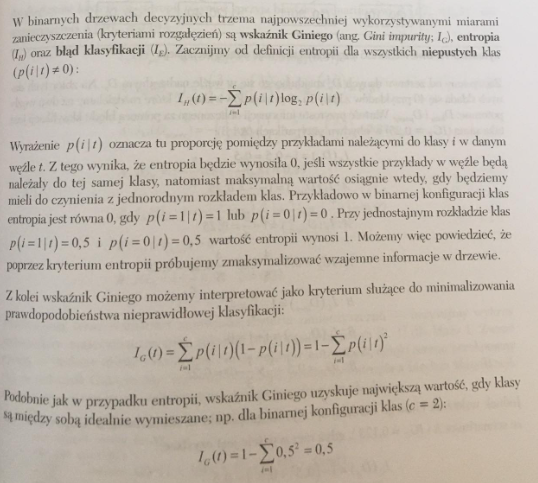


##### Błąd klasyfikacji -  nie przydatny do rowijania drzewa ale przdatny do przycinania drzewa !!
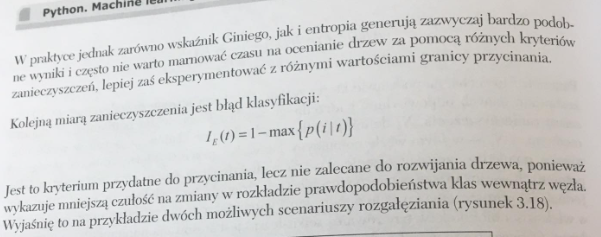
##### wskaźnik Giniego i entropia sprzyja "czystość". !!
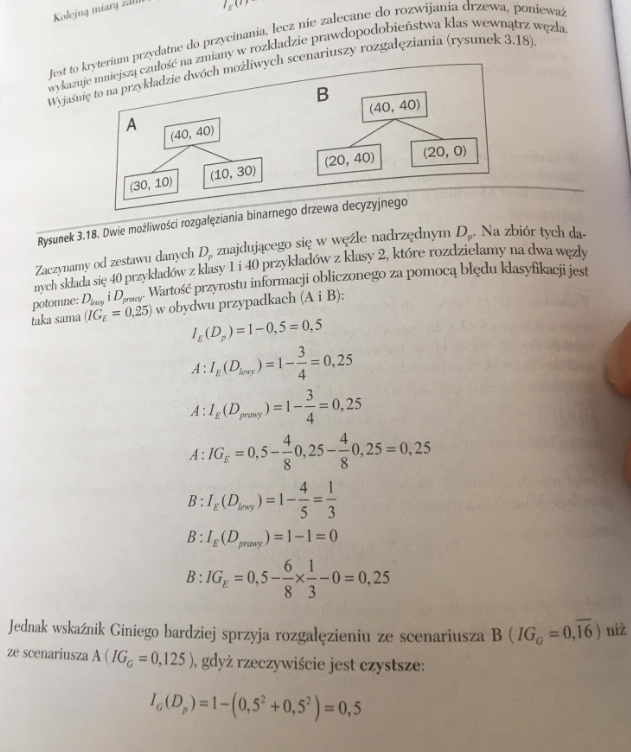
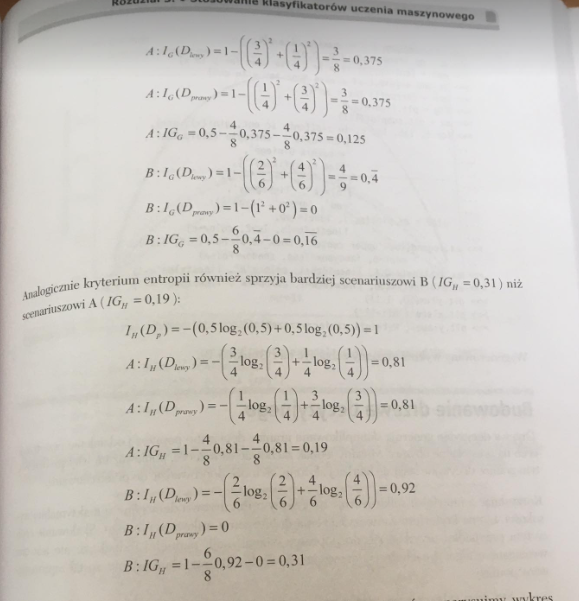


Text(0, 0.5, 'wskaźnik zanieczyszczenia')

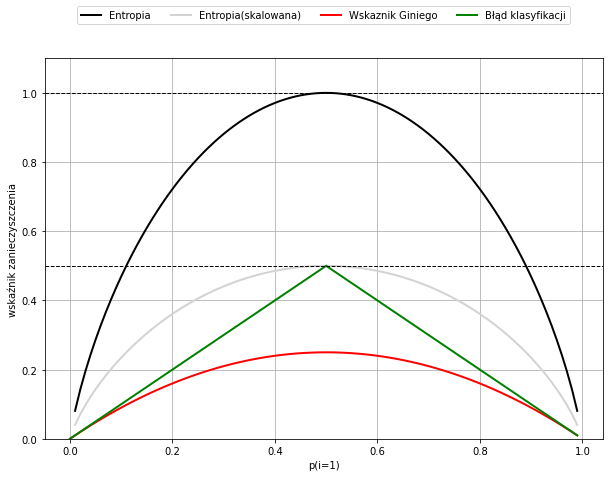

In [51]:
### wykres obrazujący 
import matplotlib
import numpy as np

def gini(p):
    return (p)*(p*(1-p))+(1-p)*(p*(1-p))
def entropy(p):
    return -p*np.log2(p) - (1-p)*np.log2((1-p))
def error(p):
    return 1- np.max([p, 1-p])

x = np.arange(0.0, 1.0, 0.01)
ent= [entropy(p) if p != 0 else None for p in x]
sc_ent = [e*0.5 if e else None for e in ent]
err = [error(i) for i in x]
fig = matplotlib.pyplot.figure(figsize=(10,7))
ax = plt.subplot(111)

for i, lab, ls, c, in zip([ent, sc_ent, gini(x), err],
                          ["Entropia", "Entropia(skalowana)",
                          "Wskaznik Giniego", "Błąd klasyfikacji"],
                          ["-","-","-","-"],
                          ["black", "lightgray",
                          "red", "green", "cyan"]):
    line = ax.plot(x, i, label=lab,
                  linestyle=ls,lw=2,color=c)
ax.legend(loc="upper center", bbox_to_anchor=(0.5,1.15),
         ncol=5, fancybox=True, shadow=False)
ax.axhline(y=0.5, linewidth=1, color="k", linestyle="--")
ax.axhline(y=1.0, linewidth=1, color="k", linestyle="--")
plt.ylim([0, 1.1])
plt.grid()
plt.xlabel("p(i=1)")
plt.ylabel("wskaźnik zanieczyszczenia")

im wieksze drzewo tym granice decyzyjne bardziej skomplikowane - łatwo dostać overfirin 

In [50]:
from sklearn.tree import DecisionTreeClassifier


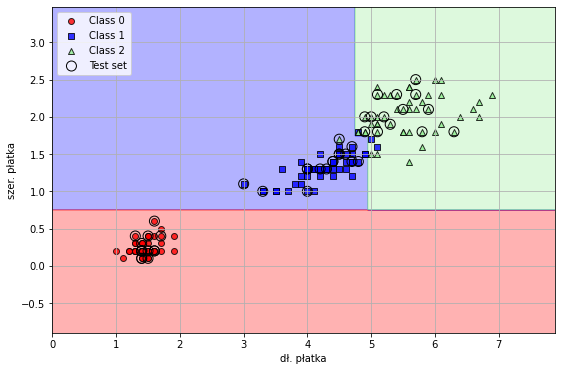

In [70]:
### wskaźnik giniego i maxymalna wyskość drzewa 4
decision_tree_3 = DecisionTreeClassifier(criterion="gini", max_depth=4, random_state=1)
decision_tree_.fit(X_train, y_train)
X_combined = np.vstack((X_train, X_test))
ycombined = np.hstack((y_train, y_test))
plot_decision_regions(X_combined, y_combined, classifier=decision_tree_, test_idx=range(105,150))

plt.xlabel("dł. płatka")
plt.ylabel("szer. płatka")
plt.legend(loc="upper left")
plt.grid()

plt.show()

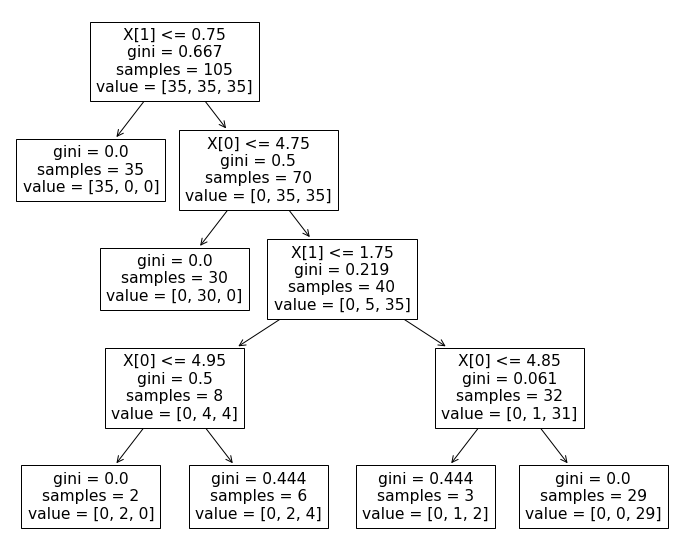

In [71]:
### wizualizacja drzewa 
from sklearn import tree
plt.figure(figsize=(12,10))
tree.plot_tree(decision_tree_)
plt.show()

In [98]:
### zapisywanie do obrazu png 
from pydotplus import graph_from_dot_data
from sklearn.tree import export_graphviz
import pydotplus
import pydot
from IPython.display import Image
from sklearn.externals.six import StringIO
import os
os.environ["PATH"] += os.pathsep + 'C:\Program Files (x86)\Graphviz2.38/bin/'

dotfile = StringIO()
tree.export_graphviz(decision_tree_, out_file=dotfile, filled=True, rounded=True,
                    class_names=["Setosa","Versicolor","Virginica"],
                    feature_names=["Długość", "szerokość"])
graph=pydotplus.graph_from_dot_data(dotfile.getvalue())
graph.write_png("dtree.png")

True

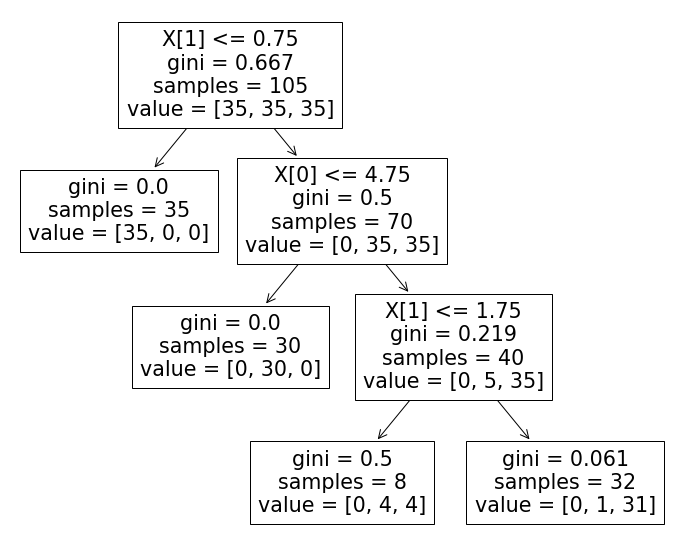

In [99]:
decision_tree_3 = DecisionTreeClassifier(criterion="gini", max_depth=3, random_state=1)
decision_tree_3.fit(X_train, y_train)

plt.figure(figsize=(12,10))
tree.plot_tree(decision_tree_3)
plt.show()

### Lasy Losowe
#### łaczą w sobie wyskoie drzewa decyzyjne, które mają duża wariancję (overfiting) w cleu stworzenia skuteczniejszego modelu. Dzieli się na 4 etapy:
- losowanie n przykładów samowspornych (losowo dobierz ze zwracaniem n przykładów z zestawu uczącego)
- Wygeneruj drzewo na podstawie próbek. W każdym węźle:
    
    * dobierz losowo d cech i nie zastepuj ich innymi.
    
    * rozdziel wezeł za pomocą najlepszej cechy (maksymalizacja informacji)
- powrórz kroki 2 i 3 k-krotnie
- zbierz prognozy i przydzielaj etykiety klasy za pomocą "głosowania wiekszościowego" (Roz. 7)
#### Najważniejszym prametrem jest k - liczba drzew. Inne hiperarametry dobriera się rzadky bo ma mniejszy wpływ na warjanacje modelu 
#### Im wiecej przykładów uczacych podajemy na poczatku tym szybciej można dostatć overfitin im mniej tym model z wiekszym obciążeniem 
#### Często używa się liczby cech d=sqrt(m) - gdzie m liczba cech w zestawie uczącym 

In [100]:
from sklearn.ensemble import RandomForestClassifier


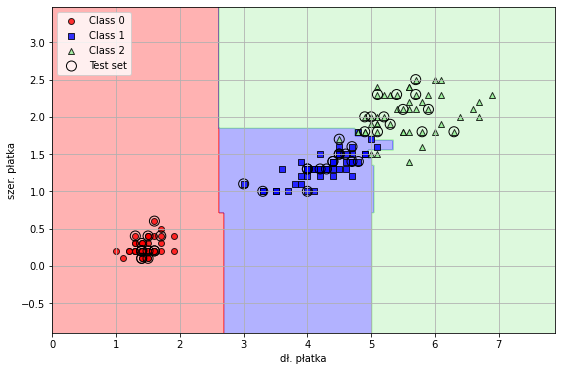

In [102]:
# n_estimators=25 -las losowy z 25 drzew
# n_jobs = 4 - ilość rdzeni procesora do liczenia (bo im wiecej drzew tym cięższy model do liczenia)
random_forest = RandomForestClassifier(criterion="gini", n_estimators=25, random_state=1 , n_jobs=4)
random_forest.fit(X_train, y_train)

plot_decision_regions(X_combined, y_combined, classifier=random_forest, test_idx=range(105,150))

plt.xlabel("dł. płatka")
plt.ylabel("szer. płatka")
plt.legend(loc="upper left")
plt.grid()

plt.show()


### Model KNN (k- najbliższych sasiadów, model leniwego uczenia)
#### Stara się zapamiętać zbiór próbek, nie uczy sie funkcji dyskryminacyjnej.
Algorymy dziela sie na parametryczne i nie parametryczne.
- Parametryczne to takie w którch ilośc hiperparamtrów jest stała i nie zależy od danych uczących ( perceptron, regresja logistyczna, SVM)
- Nie parametryczne w którch rośnie się ilość hiperparamtrów wraz z ilością danych (las losowy,  drzewo decyzyjne, jądro SVM, KNN)
#### KNN w 3 etapach: 
#### - Wybierz wartość parametru k i metrykę odległości.
#### - Znajdź k najbliższych sasiadów rekordu danych 
[Rekord (zapis) podstawowa jednostka informacji z bazie danych zawierająca pełny zestaw informacji o gromadzonych obiektach (np. opis bibliograficzny, dane teleadresowe itp.)]
#### - Przydziel etykiete klasy przez głosowanie większościowe (roz. 7)
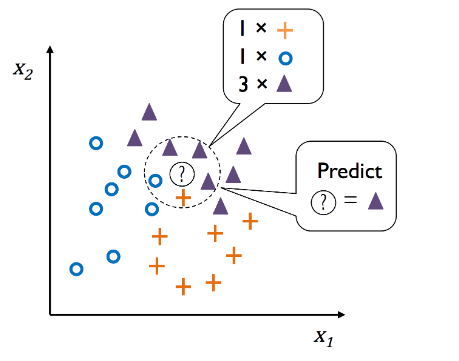
Za pomocą wyznaczonej metryki algortym wyszukuje najbliższych sasiadów, etykieta klasy nadana przez większość takich samych próbek. Natychmiastowa adaptacja po zaciagniecu danych i brak UCZENIA !

In [103]:
from sklearn.neighbors import KNeighborsClassifier


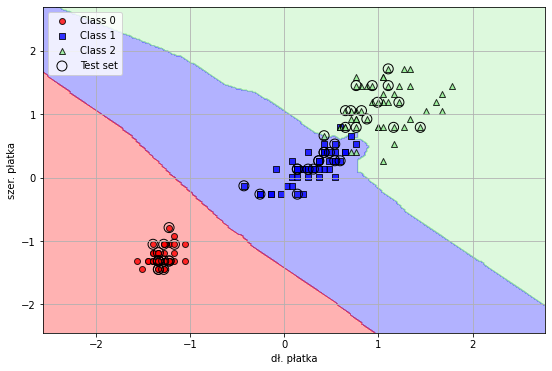

In [105]:
knn = KNeighborsClassifier(n_neighbors=5, p=2, metric="minkowski")
knn.fit(X_train_std, y_train)
plot_decision_regions(X_combined_std, y_combined, classifier=knn, test_idx=range(105,150))
plt.xlabel("dł. płatka")
plt.ylabel("szer. płatka")
plt.legend(loc="upper left")
plt.grid()

plt.show()

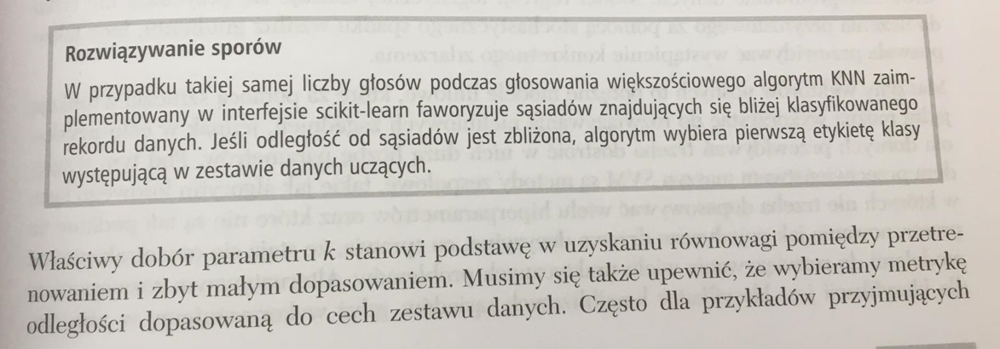
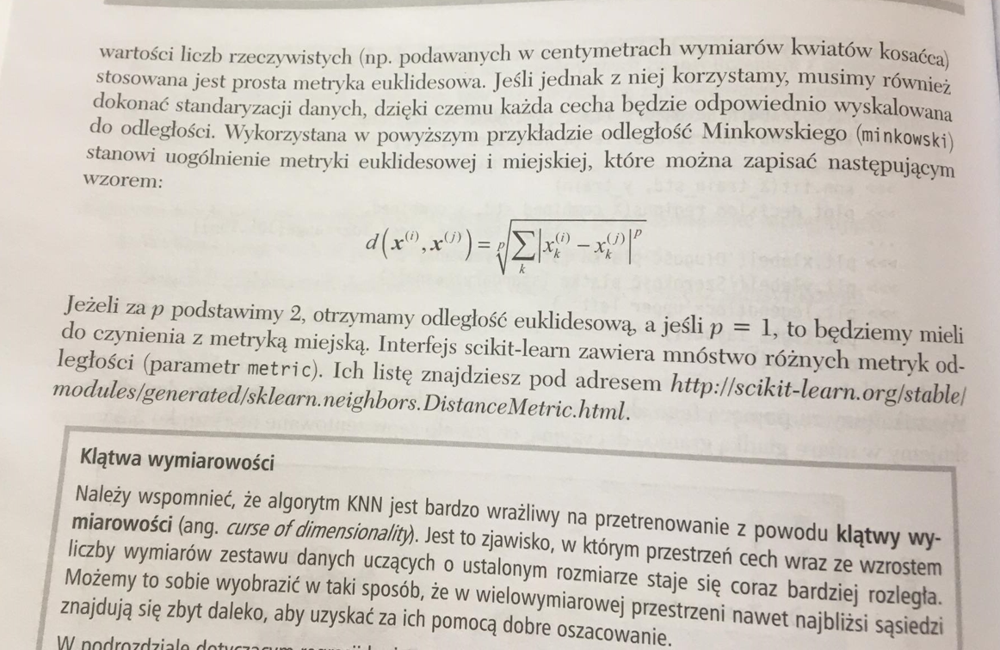